# Benchmarking Our Algorithm against others

In [1]:
import sys
sys.path.append('../../')
from time import time
import signal
from os import listdir
import numpy as np
import pickle as pkl

from panav.sequential import sequential_planning
from panav.SAMP.solvers import Tube_Planning
from panav.PIBT_pure import PIBT_plan

from benchmarks.ST_RRTStar_wrapper import sequential_ST_RRTStar 

%load_ext autoreload
%autoreload 2

<frozen importlib._bootstrap>:241: RuntimeWarning: to-Python converter for ompl::msg::LogLevel already registered; second conversion method ignored.


In [4]:
def get_env_name(filename):
    fs = filename.split('.')
    return fs[0]


def run_experiments(env_name, 
                    env_info, 
                    N_range, 
                    algs, 
                    TIMEOUT = 100,
                    results = [], 
                    executed = None):
    
    '''
        Checkpointed results and timeouted can be passed in so we can resume operation.
    '''

    if executed is None:
        executed = {alg: {N :False for N in N_range} for alg in algs}

    for N in N_range: 
        # Construct the environment
        constructor = env_info['constructor']
        specs = env_info['specs']
        env = constructor(**specs,N_agent = N)

        # Run the experiment on each algorithm
        for name,alg in algs.items():

            if executed[name][N]:
                continue
            
            print("Env:", env_name, "Alg:", name, "N agent:",N)

            result = {}
            
            def timeout_handler(signum,frame):
                print("Algorithm timeout")
                # Mark the rest of the executed table as True, so we don't ever visit this algorithm again
                for n in executed[name]:
                    if n>=N:
                        executed[name][n] = True
                # Save checkpoint data
                with open("./data/{}.pkl".format(env_name),'wb') as fp:
                    pkl.dump({'results':results, 'executed':executed},fp)
                raise TimeoutError("Timeout")
            signal.signal(signal.SIGALRM, timeout_handler)
            signal.alarm(TIMEOUT)
            try:
                t0 = time()
                plan = alg(env)
            except TimeoutError:
                print("Timeout")
            signal.alarm(0)

            t = time()-t0
            
            result['time'] = t

            result['N_agent'] = N
            result['alg_name'] = name

            result["TIMEOUT"]=TIMEOUT
            result["env"]=env

            results.append(result)

            # Mark the executed status as True
            executed[name][N] = True

            if t>TIMEOUT:
                print("Time out for algorithm", name, "N agent = ", N)
            else:
                result['plan'] = plan
                print("On time for algorithm", name, "N agent = ", N)

            # Save checkpoint data
            with open("./data/{}.pkl".format(env_name),'wb') as fp:
                pkl.dump({'results':results, 'executed':executed},fp)
            
def get_checkpoint_state(env_name,algs,N_range,first_run = False):
    if first_run:
        results = []
        executed = {alg: {N :False for N in N_range} for alg in algs}
        # Save checkpoint state
        with open("./data/{}.pkl".format(env_name),'wb') as fp:
            pkl.dump({'results':results, 'executed':executed},fp)

    # Load checkpoint state
    with open("./data/{}.pkl".format(env_name),'rb') as fp:
        ckpt = pkl.load(fp)

    results = ckpt['results']
    executed = ckpt['executed']

    return results,executed


In [72]:
bloating_r = 0.5
vmax = 1.0

TIMEOUT = 120



# Specify the Algorithms
algs = {  
        "Seq_Tube": lambda env: sequential_planning(Tube_Planning,env,vmax,bloating_r,TIMEOUT=TIMEOUT),      
        "ST-RRT*": lambda env: sequential_ST_RRTStar(env,vmax,bloating_r),
        "PIBT": lambda env,ref_plans: PIBT_plan(env,
                                      ref_plans,
                                      vmax,bloating_r,TIMEOUT,simple_plan=False)
        }
# Load environment presets
env_names = [get_env_name(fn) for fn in listdir('./envs')]

env_info = {}

for name in env_names:
    with open(f'./envs/{name}.pkl','rb') as fp:
        env_info[name] = pkl.load(fp)

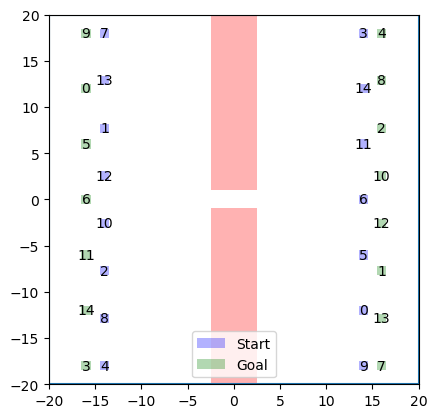

In [78]:
from panav.SAMP.solvers import Tube_Planning
from panav.ORCA_plan import ORCA_plan
env_name = 'SingleTunnel'

SEED = 13981
np.random.seed(SEED)  # Fix the random seed

env = env_info[env_name]['constructor'](**env_info[env_name]['specs'],N_agent = 15)

order = np.random.permutation(len(env.starts))

env.starts = env.starts[order]
env.goals = env.goals[order]
env.calc_start_goal_regions()
from panav.viz import draw_env
draw_env(env,show_agent_ID=True)
# Plan a ref path for everyone
ref_plans = []
for s,g in zip(env.starts,env.goals):
    planner = Tube_Planning(env,s,g,vmax,bloating_r)
    _,xs = planner.plan()
    ref_plans.append(xs)

In [79]:
plans = algs['PIBT'](env,ref_plans)

################# Time step 0 ################
Remaining agents 15
################# Time step 1 ################
Remaining agents 15
################# Time step 2 ################
Remaining agents 15
################# Time step 3 ################
Remaining agents 15
################# Time step 4 ################
Remaining agents 15
################# Time step 5 ################
Remaining agents 15
################# Time step 6 ################
Remaining agents 15
################# Time step 7 ################
Remaining agents 15
################# Time step 8 ################
Remaining agents 15
################# Time step 9 ################
Remaining agents 15
################# Time step 10 ################
Remaining agents 15
################# Time step 11 ################
Remaining agents 15
################# Time step 12 ################
Remaining agents 15
################# Time step 13 ################
Remaining agents 15
################# Time step 14 ################
Remaining 

In [80]:
from panav.ORCA_plan import ORCA_plan

SEED = 13981
np.random.seed(SEED)  # Fix the random seed

plans = ORCA_plan(env,
                  ref_plans,
                  vmax,
                  bloating_r,
                  TIMEOUT
                  )

################# Time step 0 ################
Remaining agents 15
################# Time step 1 ################
Remaining agents 15
################# Time step 2 ################
Remaining agents 15
################# Time step 3 ################
Remaining agents 15
################# Time step 4 ################
Remaining agents 15
################# Time step 5 ################
Remaining agents 15
################# Time step 6 ################
Remaining agents 15
################# Time step 7 ################
Remaining agents 15
################# Time step 8 ################
Remaining agents 15
################# Time step 9 ################
Remaining agents 15
################# Time step 10 ################
Remaining agents 15
Soft Collision. Agents  10 12 Dist 0.9928855157059929
Soft Collision. Agents  12 10 Dist 0.9928855157059929
################# Time step 11 ################
Remaining agents 15
################# Time step 12 ################
Remaining agents 15
################# 

/Users/tianpengzhang/Dropbox (Harvard University)/Tianpeng's research/Tianpeng & Lina/Multiagent Motion Planning/PA-Nav/Experiments/PIBT/../../panav/ORCA.py:323: RuntimeWarning: invalid value encountered in arcsin
  self.phi = np.arcsin(self.r/la.norm(self.center))


Soft Collision. Agents  12 13 Dist 0.6646436363062098
Soft Collision. Agents  13 12 Dist 0.6646436363062098
Soft Collision. Agents  14 2 Dist 0.8380007842978973
################# Time step 67 ################
Remaining agents 15
Soft Collision. Agents  2 14 Dist 0.8879764325556515
Soft Collision. Agents  3 11 Dist 0.552740827248176
Soft Collision. Agents  4 5 Dist 0.7753067432530794
Soft Collision. Agents  5 4 Dist 0.7753067432530794
Soft Collision. Agents  6 8 Dist 0.8556383114180939
Soft Collision. Agents  6 10 Dist 0.4811743169606773
Soft Collision. Agents  8 6 Dist 0.8556383114180939
Soft Collision. Agents  10 6 Dist 0.4811743169606773
Soft Collision. Agents  11 3 Dist 0.552740827248176
Soft Collision. Agents  12 13 Dist 0.7482615778459742
Soft Collision. Agents  13 12 Dist 0.7482615778459742
Soft Collision. Agents  14 2 Dist 0.8879764325556515
################# Time step 68 ################
Remaining agents 15
Soft Collision. Agents  2 14 Dist 0.9949970301502764
Soft Collision. Ag

IndexError: index 4 is out of bounds for axis 1 with size 4

In [69]:
from matplotlib import pyplot as plt
from panav.viz import animation
from IPython.display import HTML, display
from matplotlib import rcParams

exec_tau = 1.0

rcParams['animation.embed_limit'] = 2**128
dt = exec_tau 
agents = range(len(plans))
pos_to_ani = [np.array(plans[a][1]) for a in agents]
anim = animation(env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 

In [42]:
env_name = 'OppositionCircle'
SEED = 13981
np.random.seed(SEED)  # Fix the random seed
N_range = [10,20,30]

In [43]:
results,executed = get_checkpoint_state(env_name,algs,N_range,first_run = True)

# results,executed = get_checkpoint_state(env_name,algs,N_range)
run_experiments(env_name,
                env_info[env_name],
                N_range,
                algs,
                TIMEOUT,
                results,
                executed)

Env: OppositionCircle Alg: Seq_Tube N agent: 10
Planning for agent 0/10
Planning for agent 1/10
Planning for agent 2/10
Planning for agent 3/10
Planning for agent 4/10
Planning for agent 5/10
Planning for agent 6/10
Planning for agent 7/10
Planning for agent 8/10
Planning for agent 9/10
On time for algorithm Seq_Tube N agent =  10
Env: OppositionCircle Alg: ST-RRT* N agent: 10
Planning for agent 0/10
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 1/10
Info:    SpaceTimeRRT: Created 326 states (4 start + 322 goal)


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 2/10
Info:    SpaceTimeRRT: Created 146 states (38 start + 108 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/10
Info:    SpaceTimeRRT: Created 54 states (15 start + 39 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp

Planning for agent 4/10Info:    SpaceTimeRRT: Created 68 states (14 start + 54 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 5/10
Info:    SpaceTimeRRT: Created 93 states (17 start + 76 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 6/10
Info:    SpaceTimeRRT: Created 77 states (25 start + 52 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00



         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 7/10Info:    SpaceTimeRRT: Created 72 states (28 start + 44 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 8/10
Info:    SpaceTimeRRT: Created 35 states (8 start + 27 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 9/10


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 34 states (10 start + 24 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
On time for algorithm ST-RRT* N agent =  10
Info:    SpaceTimeRRT: Created 38 states (13 start + 25 goal)
Env: OppositionCircle Alg: PIBT N agent: 10
################# Time step 0 ################
Remaining agents 10
################# Time step 1 ################
Remaining agents 10
################# Time step 2 ################
Remaining agents 10
################# Time step 3 ################
Remaining agents 10
################# Time step 4 ################
Remaining agents 10
################# Time step 5 ################
Remaining agents 10
################# Time step 6 ################
Remaining agents 10
################# Time step 7 ################
Remaining agents 10
################# Time step 8 ################


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/20
Info:    SpaceTimeRRT: Created 114 states (27 start + 87 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/20
Info:    SpaceTimeRRT: Created 71 states (32 start + 39 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/20
Info:    SpaceTimeRRT: Created 73 states (29 start + 44 goal)


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 5/20
Info:    SpaceTimeRRT: Created 21 states (9 start + 12 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 6/20Info:    SpaceTimeRRT: Created 19 states (10 start + 9 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Info:    SpaceTimeRRT: Created 33 states (16 start + 17 goal)
Planning for agent 7/20
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 8/20
Info:    SpaceTimeRRT: Created 4 states (2 start + 2 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 9/20
Info:    SpaceTimeRRT: Created 24 states (14 start + 10 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 10/20
Info:    SpaceTimeRRT: Created 25 states (10 start + 15 goal)


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 11/20
Info:    SpaceTimeRRT: Created 19 states (8 start + 11 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 12/20


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 13 states (5 start + 8 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 13/20
Info:    SpaceTimeRRT: Created 30 states (15 start + 15 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 14/20
Info:    SpaceTimeRRT: Created 43 states (21 start + 22 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 15/20Info:    SpaceTimeRRT: Created 28 states (9 start + 19 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 32 states (14 start + 18 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 18/20
Info:    SpaceTimeRRT: Created 32 states (14 start + 18 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 19/20


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 37 states (20 start + 17 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
On time for algorithm ST-RRT* N agent =  20
Info:    SpaceTimeRRT: Created 56 states (26 start + 30 goal)
Env: OppositionCircle Alg: PIBT N agent: 20
################# Time step 0 ################
Remaining agents 20
################# Time step 1 ################
Remaining agents 20
################# Time step 2 ################
Remaining agents 20
################# Time step 3 ################
Remaining agents 20
################# Time step 4 ################
Remaining agents 20
################# Time step 5 ################
Remaining agents 20
################# Time step 6 ################
Remaining agents 20
################# Time step 7 ################
Remaining agents 20
################# Time step 8 ################


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/30
Info:    SpaceTimeRRT: Created 90 states (31 start + 59 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/30
Info:    SpaceTimeRRT: Created 64 states (21 start + 43 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/30
Info:    SpaceTimeRRT: Created 106 states (43 start + 63 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 5/30Info:    SpaceTimeRRT: Created 28 states (13 start + 15 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 6/30
Info:    SpaceTimeRRT: Created 83 states (39 start + 44 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 7/30
Info:    SpaceTimeRRT: Created 47 states (10 start + 37 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 8/30Info:    SpaceTimeRRT: Created 23 states (8 start + 15 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 9/30
Info:    SpaceTimeRRT: Created 71 states (25 start + 46 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 10/30Info:    SpaceTimeRRT: Created 22 states (7 start + 15 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 11/30
Info:    SpaceTimeRRT: Created 29 states (10 start + 19 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 12/30
Info:    SpaceTimeRRT: Created 45 states (14 start + 31 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 13/30Info:    SpaceTimeRRT: Created 49 states (22 start + 27 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 14/30
Info:    SpaceTimeRRT: Created 43 states (11 start + 32 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 15/30
Info:    SpaceTimeRRT: Created 29 states (11 start + 18 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 16/30Info:    SpaceTimeRRT: Created 53 states (27 start + 26 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 17/30
Info:    SpaceTimeRRT: Created 49 states (19 start + 30 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 18/30
Info:    SpaceTimeRRT: Created 39 states (15 start + 24 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 19/30Info:    SpaceTimeRRT: Created 17 states (5 start + 12 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 20/30
Info:    SpaceTimeRRT: Created 70 states (25 start + 45 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 21/30


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 41 states (12 start + 29 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 22/30
Info:    SpaceTimeRRT: Created 52 states (25 start + 27 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 23/30
Info:    SpaceTimeRRT: Created 26 states (10 start + 16 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 24/30
Info:    SpaceTimeRRT: Created 46 states (11 start + 35 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info: 

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 26/30Info:    SpaceTimeRRT: Created 56 states (26 start + 30 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 27/30
Info:    SpaceTimeRRT: Created 21 states (6 start + 15 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 28/30


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 27 states (11 start + 16 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 29/30
Info:    SpaceTimeRRT: Created 53 states (19 start + 34 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
On time for algorithm ST-RRT* N agent =  30
Info:    SpaceTimeRRT: Created 24 states (6 start + 18 goal)
Env: OppositionCircle Alg: PIBT N agent: 30
################# Time step 0 ################
Remaining agents 30
################# Time step 1 ################
Remaining agents 30
################# Time step 2 ################
Remaining agents 30
################# Time step 3 ################
Remaining agents 30
################# Time s

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


################# Time step 5 ################
Remaining agents 30
################# Time step 6 ################
Remaining agents 30
################# Time step 7 ################
Remaining agents 30
################# Time step 8 ################
Remaining agents 30
################# Time step 9 ################
Remaining agents 30
################# Time step 10 ################
Remaining agents 30
################# Time step 11 ################
Remaining agents 30
################# Time step 12 ################
Remaining agents 30
################# Time step 13 ################
Remaining agents 30
################# Time step 14 ################
Remaining agents 30
################# Time step 15 ################
Remaining agents 30
################# Time step 16 ################
Remaining agents 30
################# Time step 17 ################
Remaining agents 30
################# Time step 18 ################
Remaining agents 30
################# Time step 19 ################
Remai

In [18]:
env_name = 'SingleTunnel'
SEED = 13981
np.random.seed(SEED)  # Fix the random seed
N_range = [3,6,9,12,15]

In [19]:
results,executed = get_checkpoint_state(env_name,algs,N_range,first_run = True)

# results,executed = get_checkpoint_state(env_name,algs,N_range)
run_experiments(env_name,
                env_info[env_name],
                N_range,
                algs,
                240,
                results,
                executed)

Env: SingleTunnel Alg: Seq_Tube N agent: 3
Planning for agent 0/3
Planning for agent 1/3
Planning for agent 2/3
On time for algorithm Seq_Tube N agent =  3
Env: SingleTunnel Alg: ST-RRT* N agent: 3
Planning for agent 0/3
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/measurement.py:74: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 1/3Info:    SpaceTimeRRT: Created 143 states (66 start + 77 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 2/3Info:    SpaceTimeRRT: Created 361 states (175 start + 186 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
On time for algorithmInfo:    SpaceTimeRRT: Created 883 states (450 start + 433 goal)
 ST-RRT* N agent =  3
Env: SingleTunnel Alg: PIBT N agent: 3
################# Time step 0 ################
Remaining agents 3
################# Time step 1 ################
Remaining agents 3
################# Time step 2 ################
Remaining agents 3
################# Time step 3 ################
Remaining agents 3
################# Time step 4 ################
Remaining agents 3
################# Time step 5 ################
Remaining agents 3
################# Time step 6 ################
Remaining agents 3
################# Time step 7 ################
Remaining agents 3
################# Time step 8 ################
Remaining agents 3
################# Time step 9 ################
Remaining agents 3
################# Time step 10 ################
Remaining agents 3
################# Time step 11 ################
Remaining agents 3


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/6Info:    SpaceTimeRRT: Created 51 states (24 start + 27 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/6
Info:    SpaceTimeRRT: Created 127 states (59 start + 68 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 4/6Info:    SpaceTimeRRT: Created 689 states (314 start + 375 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 5/6Info:    SpaceTimeRRT: Created 1696 states (734 start + 962 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
On time for algorithm ST-RRT* N agent =  6
Info:    SpaceTimeRRT: Created 533 states (253 start + 280 goal)
Env: SingleTunnel Alg: PIBT N agent: 6
################# Time step 0 ################
Remaining agents 6
################# Time step 1 ################
Remaining agents 6
################# Time step 2 ################
Remaining agents 6
################# Time step 3 ################
Remaining agents 6
################# Time step 4 ################
Remaining agents 6
################# Time step 5 ################
Remaining agents 6
################# Time step 6 ################
Remaining agents 6
################# Time step 7 ################
Remaining agents 6
################# Time step 8 ################
Remaining agents 6
################# Time step 9 ################
Remaining agents 6
################# Time step 10 ################
Remaining agents 6
################# Time step 11 ################
Remaining agents 6


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/9Info:    SpaceTimeRRT: Created 162 states (66 start + 96 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/9
Info:    SpaceTimeRRT: Created 68 states (31 start + 37 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/9
Info:    SpaceTimeRRT: Created 54 states (24 start + 30 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 5/9
Info:    SpaceTimeRRT: Created 540 states (247 start + 293 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 6/9Info:    SpaceTimeRRT: Created 600 states (250 start + 350 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 7/9Info:    SpaceTimeRRT: Created 1613 states (748 start + 865 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 8/9
Info:    SpaceTimeRRT: Created 1541 states (690 start + 851 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


On time for algorithmInfo:    SpaceTimeRRT: Created 244 states (104 start + 140 goal)
 ST-RRT* N agent =  9
Env: SingleTunnel Alg: PIBT N agent: 9
################# Time step 0 ################
Remaining agents 9
################# Time step 1 ################
Remaining agents 9
################# Time step 2 ################
Remaining agents 9
################# Time step 3 ################
Remaining agents 9
################# Time step 4 ################
Remaining agents 9
################# Time step 5 ################
Remaining agents 9
################# Time step 6 ################
Remaining agents 9
################# Time step 7 ################
Remaining agents 9
################# Time step 8 ################
Remaining agents 9
################# Time step 9 ################
Remaining agents 9
################# Time step 10 ################
Remaining agents 9
################# Time step 11 ################
Remaining agents 9
################# Time step 12 ################
Remaining a

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 113 states (47 start + 66 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/12
Info:    SpaceTimeRRT: Created 94 states (30 start + 64 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 4/12Info:    SpaceTimeRRT: Created 63 states (27 start + 36 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 5/12
Info:    SpaceTimeRRT: Created 118 states (51 start + 67 goal)


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 6/12Info:    SpaceTimeRRT: Created 136 states (62 start + 74 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 7/12Info:    SpaceTimeRRT: Created 658 states (302 start + 356 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 8/12Info:    SpaceTimeRRT: Created 729 states (312 start + 417 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 9/12Info:    SpaceTimeRRT: Created 695 states (317 start + 378 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 10/12Info:    SpaceTimeRRT: Created 1662 states (742 start + 920 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 11/12Info:    SpaceTimeRRT: Created 1622 states (744 start + 878 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
On time for algorithmInfo:    SpaceTimeRRT: Created 1673 states (776 start + 897 goal)
 ST-RRT* N agent =  12
Env: SingleTunnel Alg: PIBT N agent: 12
################# Time step 0 ################
Remaining agents 12
################# Time step 1 ################
Remaining agents 12
################# Time step 2 ################
Remaining agents 12
################# Time step 3 ################
Remaining agents 12
################# Time step 4 ################
Remaining agents 12
################# Time step 5 ################
Remaining agents 12
################# Time step 6 ################
Remaining agents 12
################# Time step 7 ################
Remaining agents 12
################# Time step 8 ################
Remaining agents 12
################# Time step 9 ################
Remaining agents 12
################# Time step 10 ################
Remaining agen

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/15Info:    SpaceTimeRRT: Created 117 states (46 start + 71 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 3/15Info:    SpaceTimeRRT: Created 219 states (93 start + 126 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/15
Info:    SpaceTimeRRT: Created 24 states (11 start + 13 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 5/15Info:    SpaceTimeRRT: Created 62 states (31 start + 31 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 6/15Info:    SpaceTimeRRT: Created 92 states (42 start + 50 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 7/15Info:    SpaceTimeRRT: Created 102 states (47 start + 55 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 8/15Info:    SpaceTimeRRT: Created 581 states (288 start + 293 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 9/15Info:    SpaceTimeRRT: Created 1110 states (479 start + 631 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 10/15Info:    SpaceTimeRRT: Created 1609 states (736 start + 873 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Increased time bound factor to 8.00
Planning for agent 11/15Info:    SpaceTimeRRT: Created 1603 states (725 start + 878 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 12/15Info:    SpaceTimeRRT: Created 571 states (250 start + 321 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 13/15Info:    SpaceTimeRRT: Created 896 states (360 start + 536 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Planning for agent 14/15Info:    SpaceTimeRRT: Created 697 states (318 start + 379 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Increased time bound factor to 4.00
On time for algorithmInfo:    SpaceTimeRRT: Created 638 states (278 start + 360 goal)
 ST-RRT* N agent =  15
Env: SingleTunnel Alg: PIBT N agent: 15
################# Time step 0 ################
Remaining agents 15
################# Time step 1 ################
Remaining agents 15
################# Time step 2 ################
Remaining agents 15
################# Time step 3 ################
Remaining agents 15
################# Time step 4 ################
Remaining agents 15
################# Time step 5 ################
Remaining agents 15
################# Time step 6 ################
Remaining agents 15
################# Time step 7 ################
Remaining agents 15
################# Time step 8 ################
Remaining agents 15
################# Time step 9 ################
Remaining agents 15
################# Time step 10 ################
Remaining agents 15
################# Time step 11 ################
Remain

In [12]:
env_name = 'MultiTunnel'
SEED = 13981
np.random.seed(SEED)  # Fix the random seed
N_range = [3,6,9,12,15]

In [13]:
results,executed = get_checkpoint_state(env_name,algs,N_range,first_run = True)

# results,executed = get_checkpoint_state(env_name,algs,N_range)
run_experiments(env_name,
                env_info[env_name],
                N_range,
                algs,
                TIMEOUT,
                results,
                executed)

Env: MultiTunnel Alg: Seq_Tube N agent: 3
Planning for agent 0/3
Planning for agent 1/3
Planning for agent 2/3
On time for algorithm Seq_Tube N agent =  3
Env: MultiTunnel Alg: ST-RRT* N agent: 3
Planning for agent 0/3
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 1/3Info:    SpaceTimeRRT: Created 139 states (70 start + 69 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 2/3
Info:    SpaceTimeRRT: Created 102 states (43 start + 59 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
On time for algorithm ST-RRT* N agent =  3
Info:    SpaceTimeRRT: Created 70 states (35 start + 35 goal)
Env: MultiTunnel Alg: Seq_Tube N agent: 6
Planning for agent 0/6
Planning for agent 1/6
Planning for agent 2/6
Planning for agent 3/6
Planning for agent 4/6
Planning for agent 5/6
On time for algorithm Seq_Tube N agent =  6
Env: MultiTunnel Alg: ST-RRT* N agent: 6
Planning for agent 0/6
Debug:   SpaceTimeRRT: Pl

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/6Info:    SpaceTimeRRT: Created 56 states (27 start + 29 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/6
Info:    SpaceTimeRRT: Created 98 states (40 start + 58 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/6


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 72 states (38 start + 34 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 5/6
Info:    SpaceTimeRRT: Created 75 states (32 start + 43 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
On time for algorithmInfo:    SpaceTimeRRT: Created 74 states (34 start + 40 goal)
 ST-RRT* N agent =  6
Env: MultiTunnel Alg: Seq_Tube N agent: 9
Planning for agent 0/9
Planning for agent 1/9
Planning for agent 2/9
Planning for agent 3/9
Planning for agent 4/9
Planning for agent 5/9
Planning for agent 6/9
Planning for agent 7/9
Planning for agent 8/9
On time for algorithm Seq_Tube N agent =  9
Env: MultiTunnel Alg: ST-RRT* N agent: 9
Plan

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 1/9Info:    SpaceTimeRRT: Created 110 states (57 start + 53 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 2/9
Info:    SpaceTimeRRT: Created 68 states (33 start + 35 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/9


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 24 states (11 start + 13 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/9
Info:    SpaceTimeRRT: Created 85 states (46 start + 39 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 5/9Info:    SpaceTimeRRT: Created 92 states (37 start + 55 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 6/9
Info:    SpaceTimeRRT: Created 58 states (30 start + 28 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    Spa

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 7/9Info:    SpaceTimeRRT: Created 42 states (25 start + 17 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 8/9
Info:    SpaceTimeRRT: Created 41 states (18 start + 23 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


On time for algorithm ST-RRT* N agent =  9
Info:    SpaceTimeRRT: Created 37 states (18 start + 19 goal)
Env: MultiTunnel Alg: Seq_Tube N agent: 12
Planning for agent 0/12
Planning for agent 1/12
Planning for agent 2/12
Planning for agent 3/12
Planning for agent 4/12
Planning for agent 5/12
Planning for agent 6/12
Planning for agent 7/12
Planning for agent 8/12
Planning for agent 9/12
Planning for agent 10/12
Planning for agent 11/12
On time for algorithm Seq_Tube N agent =  12
Env: MultiTunnel Alg: ST-RRT* N agent: 12
Planning for agent 0/12
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 1/12
Info:    SpaceTimeRRT: Created 124 states (61 start + 63 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: 

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Info:    SpaceTimeRRT: Created 67 states (26 start + 41 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 3/12
Info:    SpaceTimeRRT: Created 99 states (44 start + 55 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/12
Info:    SpaceTimeRRT: Created 41 states (19 start + 22 goal)


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 5/12
Info:    SpaceTimeRRT: Created 58 states (30 start + 28 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 6/12Info:    SpaceTimeRRT: Created 84 states (40 start + 44 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 7/12
Info:    SpaceTimeRRT: Created 76 states (36 start + 40 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 8/12Info:    SpaceTimeRRT: Created 109 states (45 start + 64 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 9/12Info:    SpaceTimeRRT: Created 266 states (120 start + 146 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 10/12Info:    SpaceTimeRRT: Created 141 states (59 start + 82 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 11/12
Info:    SpaceTimeRRT: Created 33 states (14 start + 19 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


On time for algorithmInfo:    SpaceTimeRRT: Created 54 states (20 start + 34 goal)
 ST-RRT* N agent =  12
Env: MultiTunnel Alg: Seq_Tube N agent: 15
Planning for agent 0/15
Planning for agent 1/15
Planning for agent 2/15
Planning for agent 3/15
Planning for agent 4/15
Planning for agent 5/15
Planning for agent 6/15
Planning for agent 7/15
Planning for agent 8/15
Planning for agent 9/15
Planning for agent 10/15
Planning for agent 11/15
Planning for agent 12/15
Planning for agent 13/15
Planning for agent 14/15
On time for algorithm Seq_Tube N agent =  15
Env: MultiTunnel Alg: ST-RRT* N agent: 15
Planning for agent 0/15
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 1/15
Info:    SpaceTimeRRT: Created 69 states (26 start + 43 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Start

         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 2/15Info:    SpaceTimeRRT: Created 86 states (34 start + 52 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 3/15Info:    SpaceTimeRRT: Created 73 states (42 start + 31 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 4/15
Info:    SpaceTimeRRT: Created 36 states (15 start + 21 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 5/15Info:    SpaceTimeRRT: Created 53 states (23 start + 30 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 6/15
Info:    SpaceTimeRRT: Created 61 states (28 start + 33 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 7/15Info:    SpaceTimeRRT: Created 54 states (20 start + 34 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 8/15Info:    SpaceTimeRRT: Created 249 states (111 start + 138 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 9/15Info:    SpaceTimeRRT: Created 167 states (75 start + 92 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 10/15Info:    SpaceTimeRRT: Created 344 states (148 start + 196 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 11/15Info:    SpaceTimeRRT: Increased time bound factor to 4.00
Info:    SpaceTimeRRT: Created 516 states (209 start + 307 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 12/15Info:    SpaceTimeRRT: Created 99 states (41 start + 58 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


Planning for agent 13/15Info:    SpaceTimeRRT: Created 107 states (51 start + 56 goal)

Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00
Planning for agent 14/15
Info:    SpaceTimeRRT: Created 36 states (18 start + 18 goal)
Debug:   SpaceTimeRRT: Planner range detected to be inf
Info:    SpaceTimeRRT: Starting planning with 1 states already in datastructure
Info:    SpaceTimeRRT: Starting planning with time bound factor 2.00


         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /Users/tianpengzhang/Desktop/ompl/src/ompl/base/src/SpaceInformation.cpp


On time for algorithmInfo:    SpaceTimeRRT: Created 77 states (31 start + 46 goal)
 ST-RRT* N agent =  15
